# Forebrain dataset

En este Notebook, vamos a llevar a cabo el análisis del conjunto de datos de forebrain.
Este análisis consta de tres partes:
1. **Creación de la matriz de lecturas.** En este primer paso, , el cual es necesario para poder trabajar el conjunto de datos con dynverse en R, generamos la matriz de lecturas y guardamos en ficheros ".csv" los datos correspondientes a los nombres de las células y de los genes, las agrupaciones y las coordenadas de la reducción de dimensionalidad utilizada.
2. **Análisis del dataset usando scVelo pero usando los pasos de Velocyto.** Puesto que este dataset ha sido analizado por los creadores de Velocyto, vamos a seguir, hasta donde nos sea posible y teniendo en cuenta que estamos trabajando con una plataforma diferente, el procedimiento que ellos siguieron durante su análisis pero aplicado a scVelo. 
3. **Análisis del dataset usando scVelo pero con el filtrado estándar de scVelo.** Para poder comparar entre los distintos métodos, también vamos a llevar a cabo un análisis de los datos siguiendo el modelo de análisis estándar de scVelo.
4. **Análisis del dataset según Velocyto.** Puesto que este dataset ha sido trabajado por los creadores de Velocyto, vamos a replicar el análisis llevado a cabo por ellos, aunque añadiendo la representación de las "root cells" y los "endpoints".

Plataforma: 10x Genomics Chromium V2 kit

In [1]:
import os
import re
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import igraph
import scvelo as scv
import loompy
import anndata
import numpy as np
import scipy.io as sio
import sys
import matplotlib
import scipy.optimize
import velocyto as vcy
import glob
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist, squareform
import pickle
from IPython.core.display import display, HTML

In [2]:
# Color palette for our dataset
forebrain_color_palette = {0: '#7A0000', 1: '#FF6D00', 2: '#FF9E00', 3: "#20003D", 
                           4: "#7C33BC", 5: "#5686D9", 6: "#18AF9D"} 

## What each cluster represents:
    # Cluster 0 and 1 --> Radial glia
    # Cluster 2 and 3 --> Neuroblast
    # Cluster 4 and 5 --> Immature neuron
    # Cluster 6 --> Neuron

Here, we present a brief overview of the data we're going to be working with.

In [6]:
forebrain_dt = scv.datasets.forebrain()
forebrain_dt

  0%|          | 0.00/29.2M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'Clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [7]:
# show proportions of spliced/unspliced groupby=ndances
scv.utils.show_proportions(forebrain_dt)

Abundance of ['unspliced', 'spliced', 'ambiguous']: [0.27 0.66 0.07]


In [8]:
forebrain_dt.obs.Clusters = forebrain_dt.obs.Clusters.astype("category")

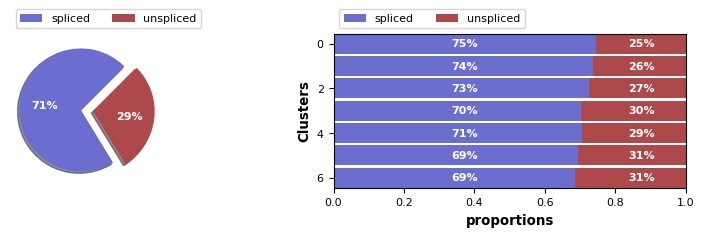

In [9]:
scv.pl.proportions(forebrain_dt, groupby="Clusters")

## 1. Save "counts" matrix, barcodes, genes and clusters

In [ ]:
# Here, we're accesing the "counts" matrix and saving it as a variable
forebrain_matrix = forebrain_dt.X.transpose()
forebrain_matrix

In [ ]:
sio.mmwrite("data/forebrain_sparse_matrix.mtx", forebrain_matrix)

In [ ]:
# Here, we are saving the barcodes (cell_names)
barcodes = forebrain_dt.obs_names.to_frame()
barcodes

In [ ]:
barcodes.to_csv(path_or_buf="data/forebrain_barcodes.csv", sep="\t", header=False)

In [ ]:
# Here, we are saving the genes
features = forebrain_dt.var_names.to_frame()
features

In [ ]:
features.to_csv(path_or_buf="data/forebrain_genes.csv", sep="\t", header=False)

In [ ]:
# Here, I'm going to save the clusters

clusters = forebrain_dt.obs.Clusters.to_frame()
clusters.rename(columns = {'Clusters':'group_id'}, inplace = True)
clusters

In [ ]:
clusters.to_csv(path_or_buf="data/forebrain_clusters.csv", sep=",", header=True)

In [ ]:
# Save the dimensionality reduction to use it in dynverse (in this case, we have to use "forebrain_stochastic" to get the 
# dimensionality reduction, because we don't have a dimensionality reduction originally, 
# so we've had to run some code to obtain it)

df_pca = pd.DataFrame(forebrain_stochastic.obsm["X_pca"],
                  index= forebrain_stochastic.obs_names)
df_pca

In [ ]:
df_pca.to_csv(path_or_buf="data/forebrain_pca_6.csv", sep="\t", header=True)

## 2. Análisis con scVelo siguiendo los parametros de Velocyto

### 2.1. Stochastic model

In [39]:
forebrain_stochastic = scv.datasets.forebrain()
forebrain_stochastic

AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'Clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

#### 2.1.1. Analysis

In [40]:
scv.pp.filter_and_normalize(forebrain_stochastic, min_counts=30, min_cells=20, n_top_genes=2000)

Filtered out 22520 genes that are detected 30 counts (spliced).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


In [41]:
scv.pp.filter_and_normalize(forebrain_stochastic, min_counts_u=25, min_cells_u=20)

Filtered out 612 genes that are detected 25 counts (unspliced).


In [42]:
forebrain_stochastic
# In the original analysis, a total of 987 genes that had unspliced molecules above a detection threshold were kept for 
# the analysis (requiring 25 minimum expressed counts and detected over 20 cells; average spliced counts for a gene 0.06 
# in a subpopulation and average unspliced counts for a gene 0.007 in a subpopulation). 
# However, after our analysis, we have 1388 genes, probably due to differences in the filtering process between the methods.

AnnData object with n_obs × n_vars = 1720 × 1388
    obs: 'Clusters', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [43]:
scv.pp.moments(forebrain_stochastic, n_pcs=6, n_neighbors=550)

computing neighbors
    finished (0:00:04) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [44]:
scv.tl.velocity(forebrain_stochastic, mode="stochastic")

computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [45]:
scv.tl.velocity_graph(forebrain_stochastic, n_jobs=8)

computing velocity graph (using 4/4 cores)


  0%|          | 0/1720 [00:00<?, ?cells/s]

    finished (0:01:36) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_stream_velocyto.png


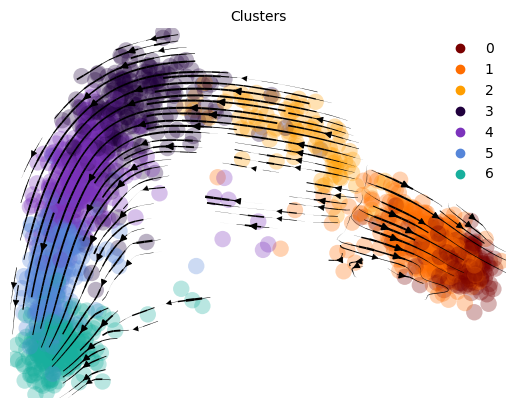

In [26]:
scv.pl.velocity_embedding_stream(forebrain_stochastic, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best",
                                 save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_stream_velocyto.png")


computing velocity embedding
    finished (0:00:04) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_arrows_velocyto.png


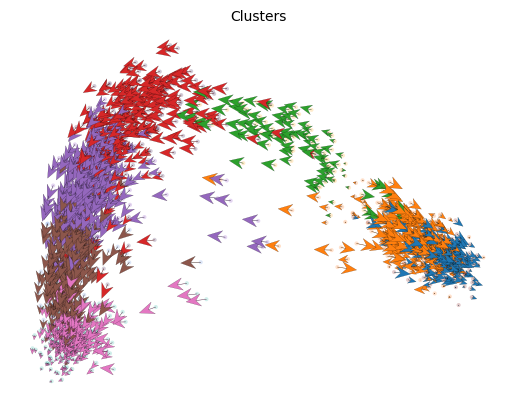

In [37]:
scv.pl.velocity_embedding(forebrain_stochastic, basis='pca', arrow_length=5, arrow_size=5, 
                          palette=forebrain_color_palette, color="Clusters", 
                          save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_arrows_velocyto.png")


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


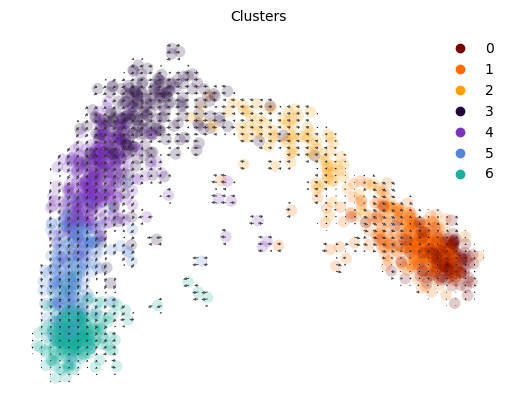

In [46]:
scv.pl.velocity_embedding_grid(forebrain_stochastic, basis='pca', palette=forebrain_color_palette, 
                               color="Clusters", legend_loc="best")


#### 2.1.2. Velocity confidence

In [47]:
scv.tl.velocity_confidence(forebrain_stochastic)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


In [48]:
np.mean(forebrain_stochastic.obs["velocity_confidence"])

0.9117896210315616

In [49]:
np.median(forebrain_stochastic.obs["velocity_confidence"])

0.9229486584663391

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_confidence_velocyto.png


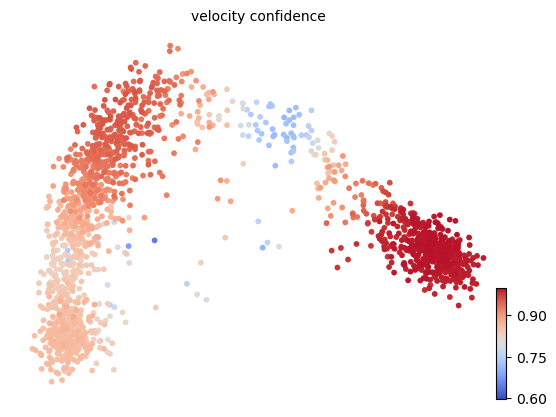

In [50]:
scv.pl.scatter(forebrain_stochastic, c="velocity_confidence", cmap="coolwarm", vmin=0.6, vmax=1, 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_confidence_velocyto.png")

#### 2.1.3. Velocity pseudotime (comparable to latent time)

In [51]:
scv.tl.velocity_pseudotime(forebrain_stochastic)

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:05) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_pseudotime_velocyto.png


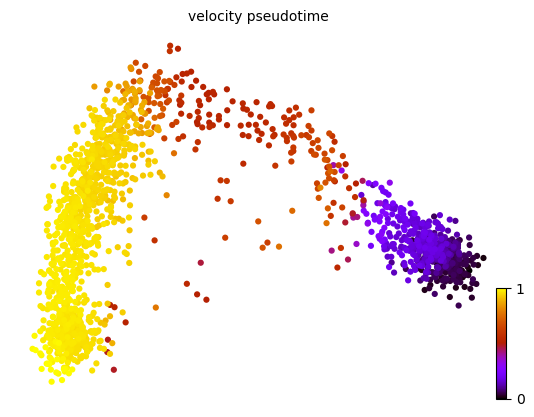

In [52]:
scv.pl.scatter(forebrain_stochastic, basis="pca", color='velocity_pseudotime', color_map='gnuplot', size=80,
              save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_pseudotime_velocyto.png")

In [53]:
scv.tl.rank_velocity_genes(forebrain_stochastic, groupby='Clusters')

ranking velocity genes


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\tools\utils.py:501: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:03) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/fore_stochastic_pseudotime_heatmap_velocyto.png


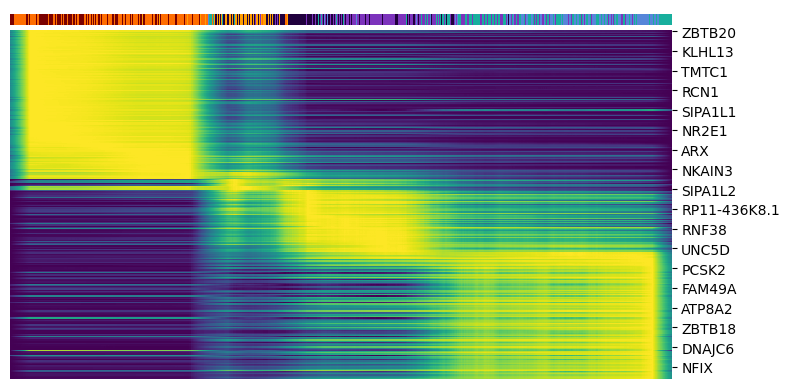

In [57]:
top_genes = forebrain_stochastic.var['spearmans_score'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(forebrain_stochastic, var_names=top_genes, sortby='velocity_pseudotime', col_color='Clusters', 
               n_convolve=100, save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_pseudotime_heatmap_velocyto.png")

#### 2.1.4. Root cells and endpoints

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_root_end_velocyto.png


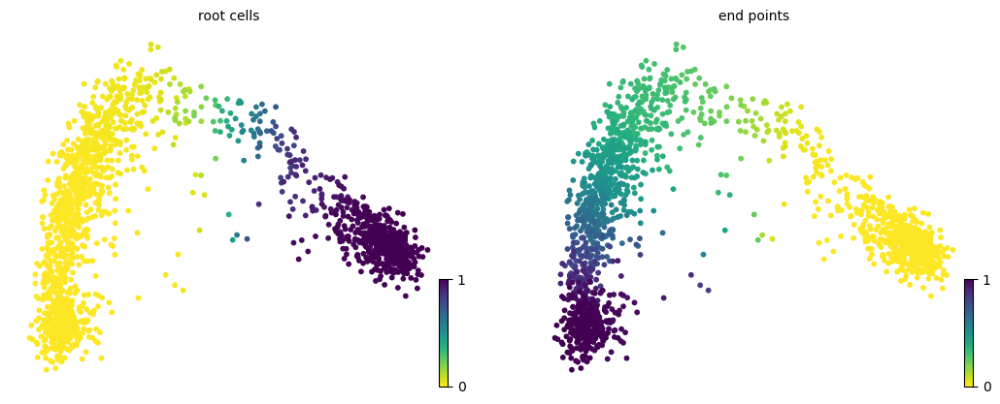

In [58]:
scv.pl.scatter(forebrain_stochastic, color=["root_cells", "end_points"], 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_root_end_velocyto.png")

#### 2.1.5. Top-spearmans_score genes

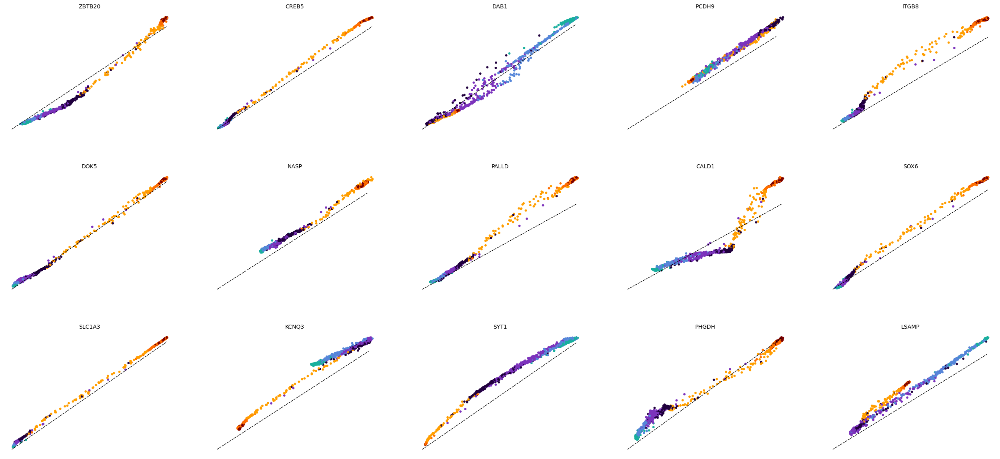

In [59]:
top_genes = forebrain_stochastic.var['spearmans_score'].sort_values(ascending=False).index
scv.pl.scatter(forebrain_stochastic, basis=top_genes[:15], ncols=5, frameon=False, color="Clusters")

#### 2.1.6. Cluster-specific top-spearmans_score genes

In [60]:
df = scv.get_df(forebrain_stochastic, 'rank_velocity_genes/names')
df.head(5)

,0,1,2,3,4,5,6
0,STAT5B,RAB31,CCDC109B,RUNX1T1,CNTNAP2,LINC01122,ASXL3
1,TPM4,ZFP36L1,MFNG,SYNDIG1,PTMS,MLLT3,ANK3
2,KIF9,RHOBTB1,DARS,BCL11B,CSRP2,NRN1,PTPRD
3,CCDC181,SDC2,LPIN1,IGSF3,NTM,ZSWIM8,TNR
4,EEF1D,BMPR1B,TENM3,PLXNA4,SLC8A2,JARID2,BACE2


### 2.2 Dynamical model

In [61]:
forebrain_dynamical = scv.datasets.forebrain()

#### 2.2.1. Analysis

In [62]:
scv.pp.filter_and_normalize(forebrain_dynamical, min_counts=30, min_cells=20, n_top_genes=2000)

Filtered out 22520 genes that are detected 30 counts (spliced).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


In [63]:
scv.pp.filter_and_normalize(forebrain_dynamical, min_counts_u=25, min_cells_u=20)

Filtered out 612 genes that are detected 25 counts (unspliced).


In [64]:
forebrain_dynamical
# In the original analysis, a total of 987 genes that had unspliced molecules above a detection threshold were kept for 
# the analysis (requiring 25 minimum expressed counts and detected over 20 cells; average spliced counts for a gene 0.06 
# in a subpopulation and average unspliced counts for a gene 0.007 in a subpopulation). 
# However, after our analysis, we have 1388 genes, probably due to differences in the filtering process between the methods.

AnnData object with n_obs × n_vars = 1720 × 1388
    obs: 'Clusters', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [65]:
scv.pp.moments(forebrain_dynamical, n_pcs=6, n_neighbors=550)

computing neighbors
    finished (0:00:04) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:04) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [66]:
scv.tl.recover_dynamics(forebrain_dynamical, n_jobs=8)

recovering dynamics (using 4/4 cores)


  0%|          | 0/991 [00:00<?, ?gene/s]

    finished (0:18:07) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [67]:
scv.tl.velocity(forebrain_dynamical, mode='dynamical')
scv.tl.velocity_graph(forebrain_dynamical, n_jobs=8)

computing velocities
    finished (0:00:14) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 4/4 cores)


  0%|          | 0/1720 [00:00<?, ?cells/s]

    finished (0:01:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [68]:
forebrain_dynamical.write('data/forebrain_dynamical_velocyto_analysis_550.h5ad', compression='gzip')

In [72]:
forebrain_dynamical = scv.read('data/forebrain_dynamical_velocyto_analysis_550.h5ad')

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_stream_velocyto.png


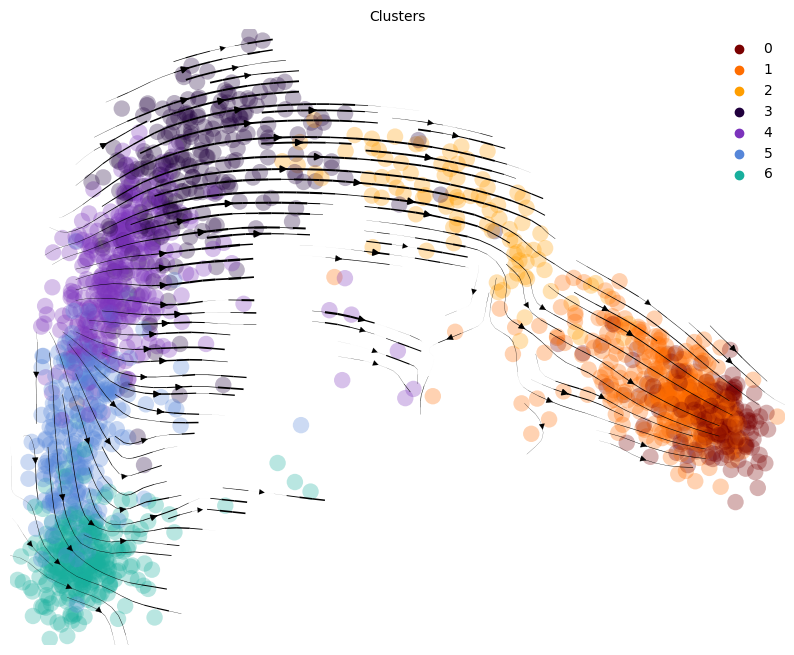

In [69]:
scv.pl.velocity_embedding_stream(forebrain_dynamical, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best",
                                 save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_stream_velocyto.png")


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_arrows_velocyto.png


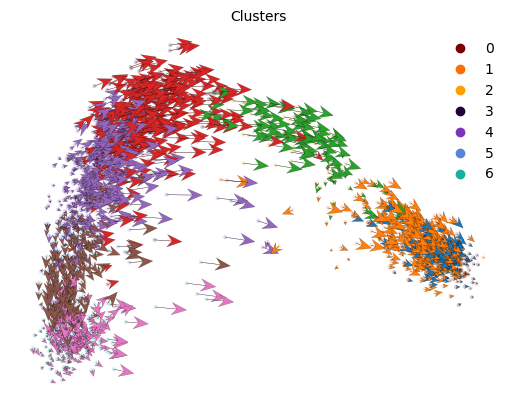

In [71]:
scv.pl.velocity_embedding(forebrain_dynamical, basis='pca', arrow_length=5, arrow_size=5, palette=forebrain_color_palette,
                          color="Clusters", legend_loc="best", save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_arrows_velocyto.png")


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


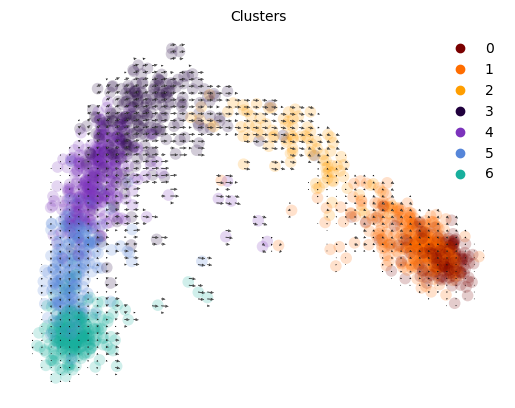

In [73]:
scv.pl.velocity_embedding_grid(forebrain_dynamical, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best")


#### 2.2.2. Velocity confidence

In [74]:
scv.tl.velocity_confidence(forebrain_dynamical)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


In [75]:
np.mean(forebrain_dynamical.obs["velocity_confidence"])

0.9422914050770871

In [76]:
np.median(forebrain_dynamical.obs["velocity_confidence"])

0.9615806128997029

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_confidence_velocyto.png


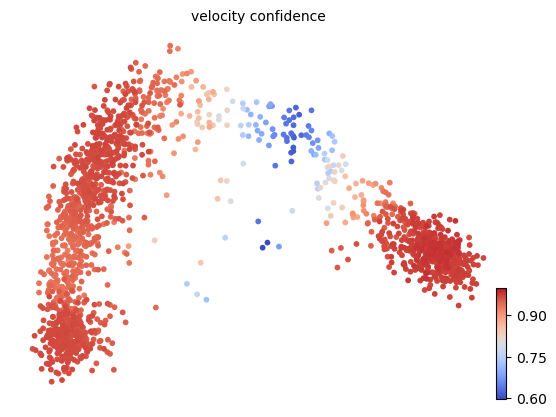

In [77]:
scv.pl.scatter(forebrain_dynamical, c="velocity_confidence", cmap="coolwarm", vmin=0.6, vmax=1, 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_confidence_velocyto.png")

#### 2.2.3. Latent time

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:03) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_pseudotime_velocyto.png


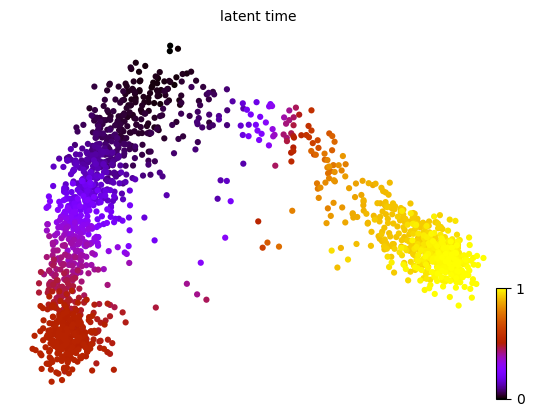

In [78]:
scv.tl.latent_time(forebrain_dynamical)
scv.pl.scatter(forebrain_dynamical, color='latent_time', color_map='gnuplot', size=80,
              save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_pseudotime_velocyto.png")

saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/fore_dynamical_pseudotime_heatmap_velocyto.png


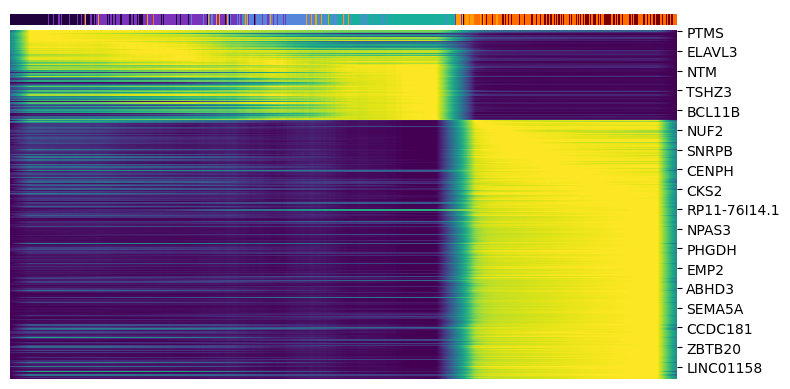

In [80]:
top_genes = forebrain_dynamical.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(forebrain_dynamical, var_names=top_genes, sortby='latent_time', col_color='Clusters', n_convolve=100,
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_pseudotime_heatmap_velocyto.png")


#### 2.2.4. Root cells and endpoints

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_root_end_velocyto.png


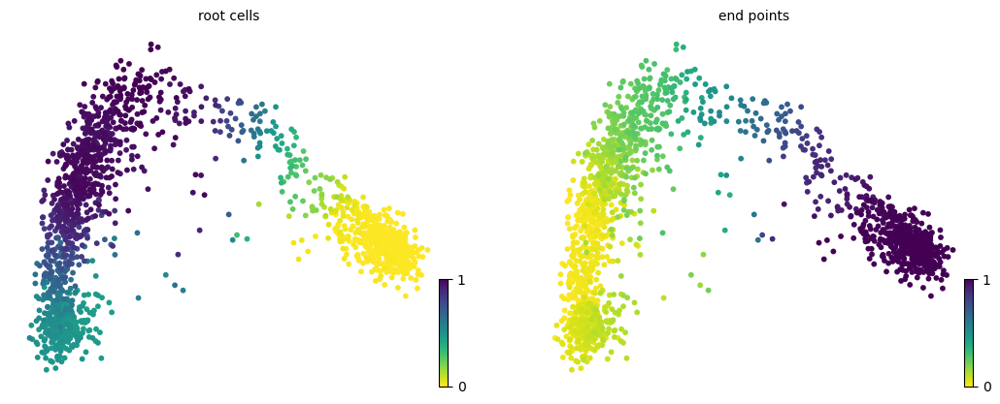

In [81]:
scv.pl.scatter(forebrain_dynamical, color=["root_cells", "end_points"], 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_root_end_velocyto.png")

#### 2.2.5. Top-likelihood genes

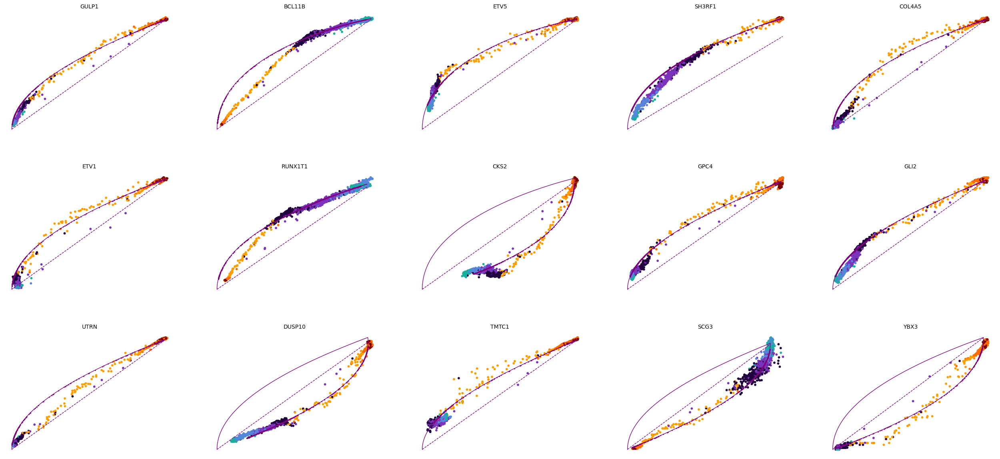

In [82]:
top_genes = forebrain_dynamical.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(forebrain_dynamical, basis=top_genes[:15], ncols=5, frameon=False, color="Clusters")


#### 2.2.6. Cluster-specific top-likelihood genes

In [83]:
scv.tl.rank_dynamical_genes(forebrain_dynamical, groupby='Clusters')
df = scv.get_df(forebrain_dynamical, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:11) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,0,1,2,3,4,5,6
0,GULP1,GULP1,ZFHX4,GLI2,BCL11B,BCL11B,BCL11B
1,ETV5,ETV5,SH3RF1,BCL11B,SCG3,SCG3,RUNX1T1
2,ETV1,ETV1,GULP1,RUNX1T1,RUNX1T1,RUNX1T1,SCG3
3,COL4A5,COL4A5,TFAP2C,TMEM123,ABRACL,MAPT,PAK7
4,SH3RF1,SH3RF1,GLI2,CLCN4,EMX2,PAK7,ABRACL


### 2.3. Deterministic model

In [103]:
forebrain_deterministic = scv.datasets.forebrain()
forebrain_deterministic

AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'Clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

#### 2.3.1. Analysis

In [104]:
scv.pp.filter_and_normalize(forebrain_deterministic, min_counts=30, min_cells=20, n_top_genes=2000)

Filtered out 22520 genes that are detected 30 counts (spliced).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


In [105]:
scv.pp.filter_and_normalize(forebrain_deterministic, min_counts_u=25, min_cells_u=20)

Filtered out 612 genes that are detected 25 counts (unspliced).


In [106]:
forebrain_deterministic
# In the original analysis, a total of 987 genes that had unspliced molecules above a detection threshold were kept for 
# the analysis (requiring 25 minimum expressed counts and detected over 20 cells; average spliced counts for a gene 0.06 
# in a subpopulation and average unspliced counts for a gene 0.007 in a subpopulation). 
# However, after our analysis, we have 1388 genes, probably due to differences in the filtering process between the methods.

AnnData object with n_obs × n_vars = 1720 × 1388
    obs: 'Clusters', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [107]:
scv.pp.moments(forebrain_deterministic, n_pcs=6, n_neighbors=550)

computing neighbors
    finished (0:00:03) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [108]:
scv.tl.velocity(forebrain_deterministic, mode="deterministic")

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [109]:
scv.tl.velocity_graph(forebrain_deterministic, n_jobs=8)

computing velocity graph (using 4/4 cores)


  0%|          | 0/1720 [00:00<?, ?cells/s]

    finished (0:01:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:03) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_stream_velocyto.png


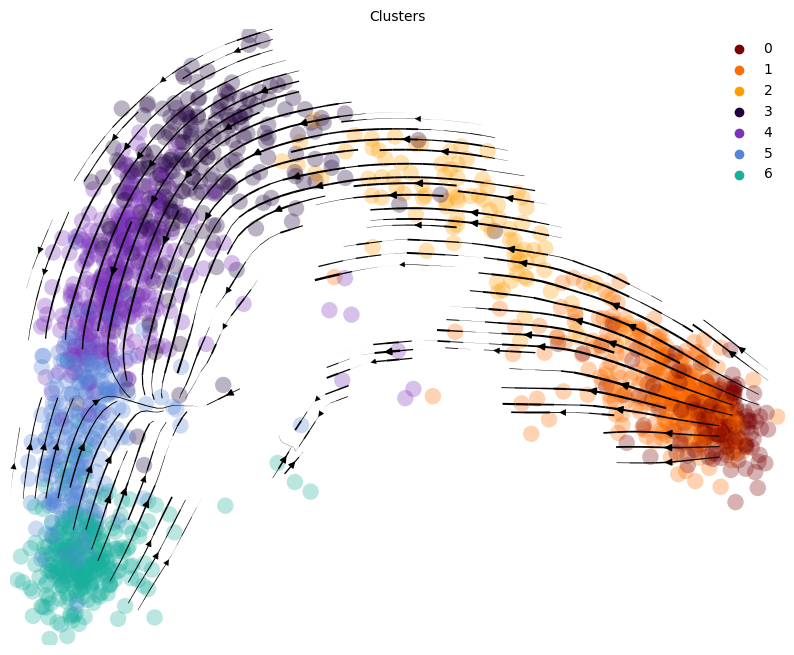

In [91]:
scv.pl.velocity_embedding_stream(forebrain_deterministic, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best", figsize=(10,8),
                                 save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_stream_velocyto.png")


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_arrows_velocyto.png


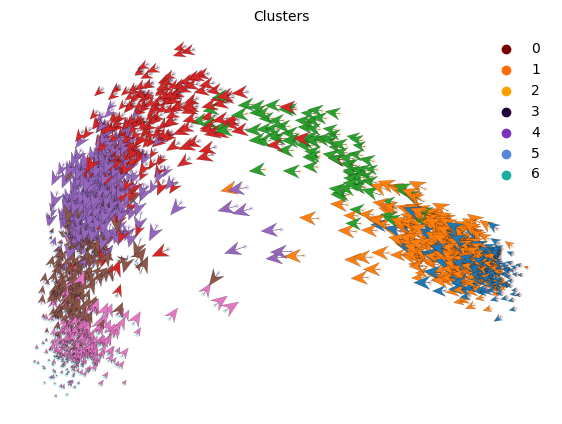

In [111]:
scv.pl.velocity_embedding(forebrain_deterministic, basis='pca', arrow_length=5, arrow_size=5, palette=forebrain_color_palette, figsize=(7,5), 
                          color="Clusters", legend_loc="best", save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_arrows_velocyto.png")


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


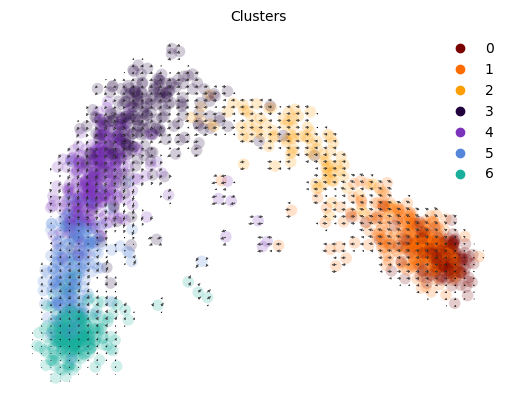

In [113]:
scv.pl.velocity_embedding_grid(forebrain_deterministic, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best")


#### 2.3.2. Velocity confidence

In [92]:
scv.tl.velocity_confidence(forebrain_deterministic)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


In [93]:
np.mean(forebrain_deterministic.obs["velocity_confidence"])

0.8627047592124274

In [94]:
np.median(forebrain_deterministic.obs["velocity_confidence"])

0.8734433054924011

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_confidence_velocyto.png


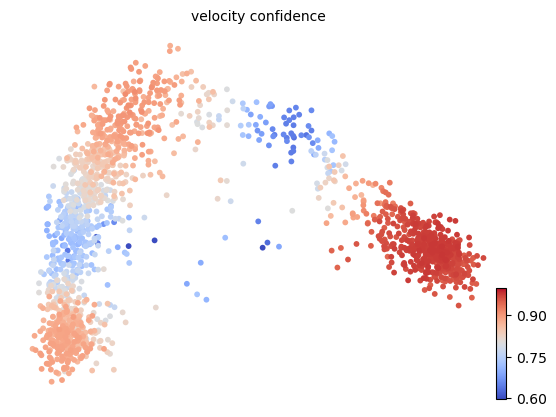

In [95]:
scv.pl.scatter(forebrain_deterministic, c="velocity_confidence", cmap="coolwarm", vmin=0.6, vmax=1, 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_confidence_velocyto.png")

#### 2.3.3. Velocity pseudotime (comparable to latent time)

In [96]:
scv.tl.velocity_pseudotime(forebrain_deterministic)

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:03) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_pseudotime_velocyto.png


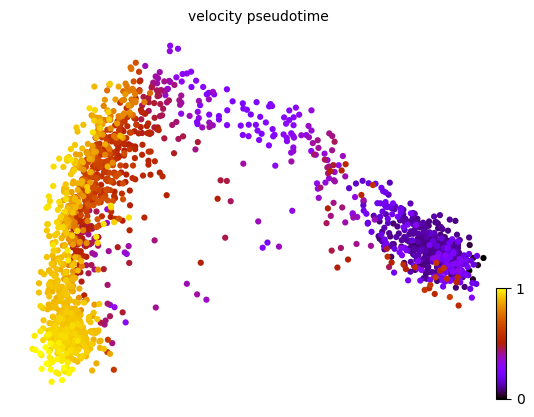

In [97]:
scv.pl.scatter(forebrain_deterministic, basis="pca", color='velocity_pseudotime', color_map='gnuplot', size=80,
              save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_pseudotime_velocyto.png")

In [98]:
scv.tl.rank_velocity_genes(forebrain_deterministic, groupby='Clusters')

ranking velocity genes


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\tools\utils.py:501: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:02) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/fore_deterministic_pseudotime_heatmap_velocyto.png


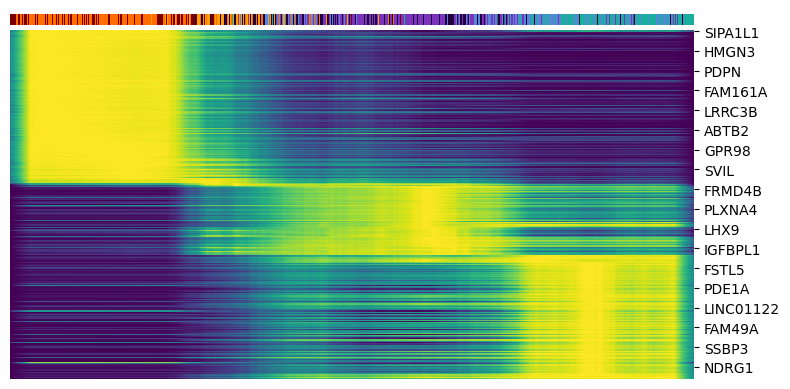

In [99]:
top_genes = forebrain_deterministic.var['spearmans_score'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(forebrain_deterministic, var_names=top_genes, sortby='velocity_pseudotime', col_color='Clusters', 
               n_convolve=100, save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_pseudotime_heatmap_velocyto.png")

#### 2.3.4. Root cells and endpoints

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_root_end_velocyto.png


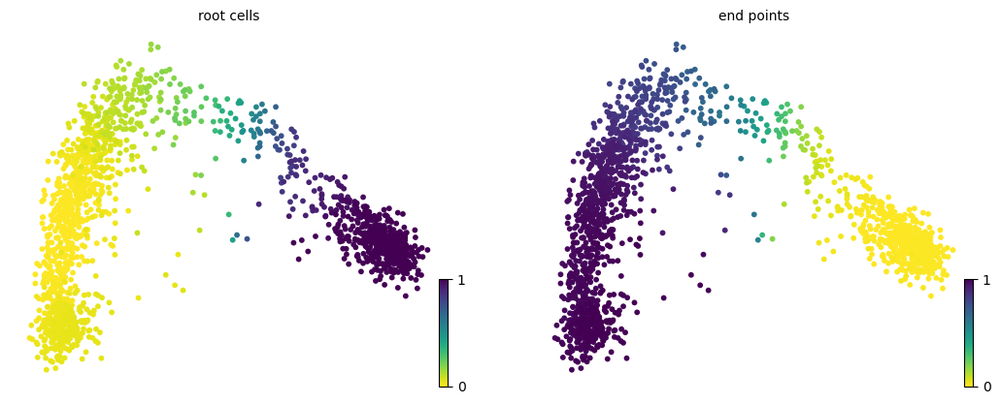

In [100]:
scv.pl.scatter(forebrain_deterministic, color=["root_cells", "end_points"], 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_root_end_velocyto.png")

#### 2.3.5. Top-spearmans_score genes

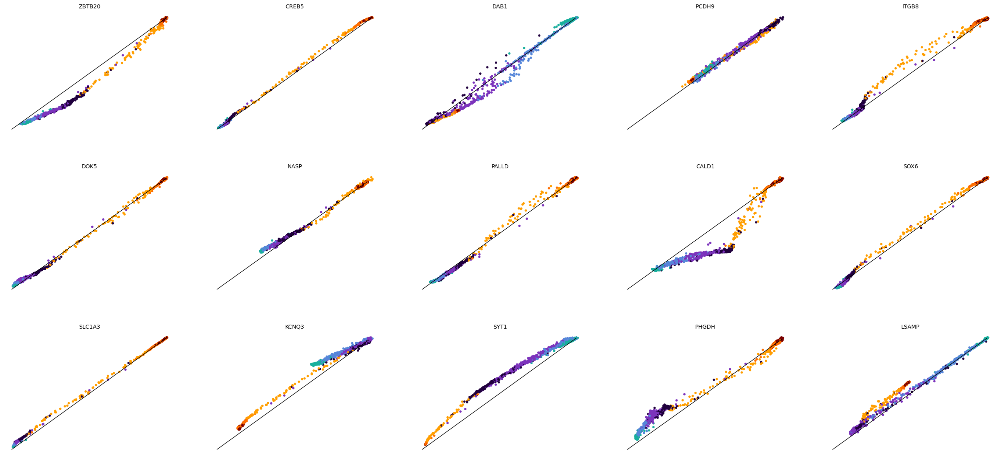

In [101]:
top_genes = forebrain_deterministic.var['spearmans_score'].sort_values(ascending=False).index
scv.pl.scatter(forebrain_deterministic, basis=top_genes[:15], ncols=5, frameon=False, color="Clusters")

#### 2.3.6. Cluster-specific top-spearmans_score genes

In [102]:
df = scv.get_df(forebrain_deterministic, 'rank_velocity_genes/names')
df.head(5)

,0,1,2,3,4,5,6
0,EEF1D,LMO1,FOXP2,RUNX1T1,SLC8A2,CERS4,ANK3
1,PLEKHA8,FAT3,PTPRZ1,BCL11B,PTMS,SEMA6D,CDC73
2,CCDC181,VCL,ROBO2,SYNDIG1,SLC17A7,GPBP1L1,NR1D2
3,HSPH1,NEO1,PLXNA2,CTTNBP2,LIN7A,JARID2,LIMA1
4,CDC42EP3,DESI2,DCC,GRIA3,FAM49A,TCF3,SSTR2


## 3. Análisis con scVelo siguiendo los parametros estándar del mismo

### 3.1. Stochastic model (using scVelo's standard analysis pipeline)

In [121]:
forebrain_stochastic_st = scv.datasets.forebrain()
forebrain_stochastic_st

AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'Clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

#### 3.1.1. Analysis

In [122]:
scv.pp.filter_and_normalize(forebrain_stochastic_st, min_shared_counts=20, n_top_genes=2000)

Filtered out 26764 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


In [123]:
scv.pp.moments(forebrain_stochastic_st, n_pcs=30, n_neighbors=30)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [124]:
scv.tl.velocity(forebrain_stochastic_st, mode="stochastic")

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [125]:
scv.tl.velocity_graph(forebrain_stochastic_st)

computing velocity graph (using 1/4 cores)


  0%|          | 0/1720 [00:00<?, ?cells/s]

    finished (0:00:17) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_stream_scvelo.png


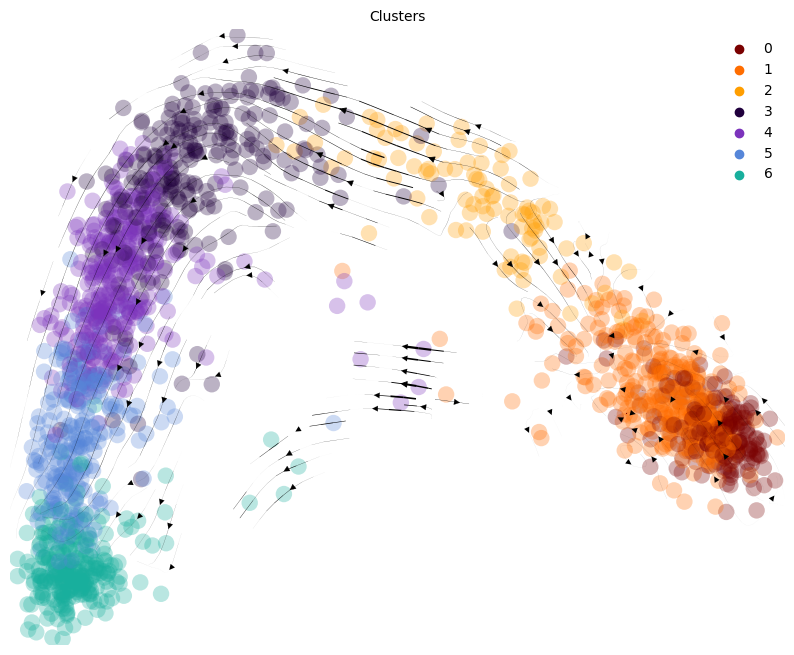

In [120]:
scv.pl.velocity_embedding_stream(forebrain_stochastic_st, basis='pca', palette=forebrain_color_palette, color="Clusters", 
                                 legend_loc="best", figsize=(10,8),
                                 save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_stream_scvelo.png")


computing velocity embedding
    finished (0:00:03) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_arrows_scvelo.png


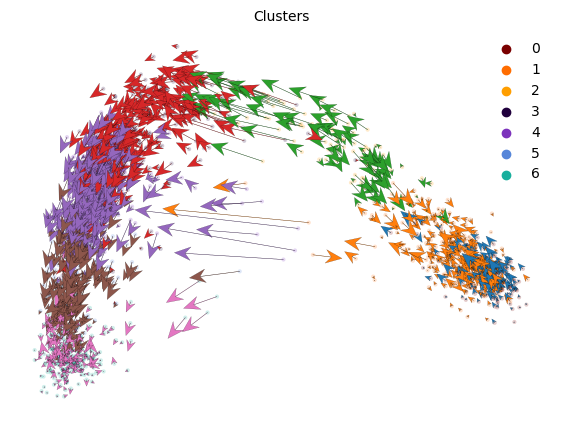

In [127]:
scv.pl.velocity_embedding(forebrain_stochastic_st, basis='pca', arrow_length=5, arrow_size=5, palette=forebrain_color_palette, 
                          figsize=(7,5), color="Clusters", legend_loc="best", 
                          save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_arrows_scvelo.png")


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


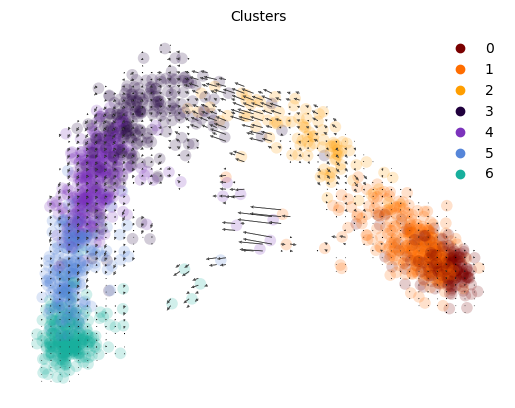

In [129]:
scv.pl.velocity_embedding_grid(forebrain_stochastic_st, basis='pca', palette=forebrain_color_palette, color="Clusters", 
                               legend_loc="best")


#### 3.1.2. Comparing it to the previous model

In [ ]:
scv.pl.velocity_embedding_stream(forebrain_stochastic, basis='pca', palette=forebrain_color_palette, color="Clusters", 
                                 legend_loc="best")


In [ ]:
scv.pl.velocity_embedding_stream(forebrain_stochastic_st, basis='pca', palette=forebrain_color_palette, color="Clusters", 
                                 legend_loc="best")


#### 3.1.3. Velocity confidence

In [130]:
scv.tl.velocity_confidence(forebrain_stochastic_st)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


In [131]:
np.mean(forebrain_stochastic_st.obs["velocity_confidence"])

0.8188807049636231

In [132]:
np.median(forebrain_stochastic_st.obs["velocity_confidence"])

0.8309527933597565

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_confidence_scvelo.png


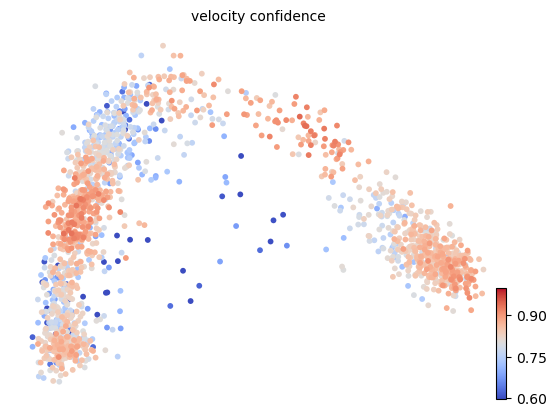

In [133]:
scv.pl.scatter(forebrain_stochastic_st, c="velocity_confidence", cmap="coolwarm", vmin=0.6, vmax=1, 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_confidence_scvelo.png")

#### 3.1.4. Velocity pseudotime (comparable to latent time)

In [134]:
scv.tl.velocity_pseudotime(forebrain_stochastic_st)

computing terminal states
    identified 2 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_pseudotime_scvelo.png


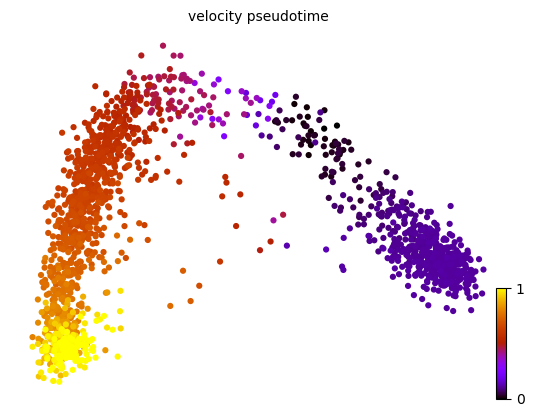

In [135]:
scv.pl.scatter(forebrain_stochastic_st, basis="pca", color='velocity_pseudotime', color_map='gnuplot', size=80,
              save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_pseudotime_scvelo.png")

In [136]:
scv.tl.rank_velocity_genes(forebrain_stochastic_st, groupby='Clusters')

ranking velocity genes


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\tools\utils.py:501: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:04) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_pseudotime_heatmap_scvelo.png


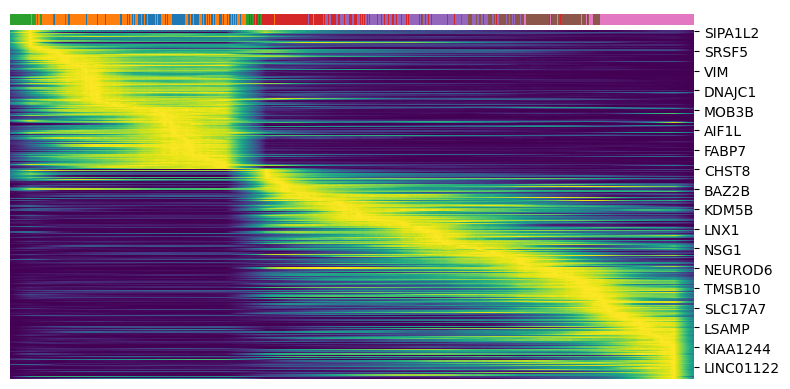

In [137]:
top_genes = forebrain_stochastic_st.var['spearmans_score'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(forebrain_stochastic_st, var_names=top_genes, sortby='velocity_pseudotime', col_color='Clusters', 
               n_convolve=100, save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_pseudotime_heatmap_scvelo.png")

#### 3.1.5. Root cells and endpoints

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_root_end_scvelo.png


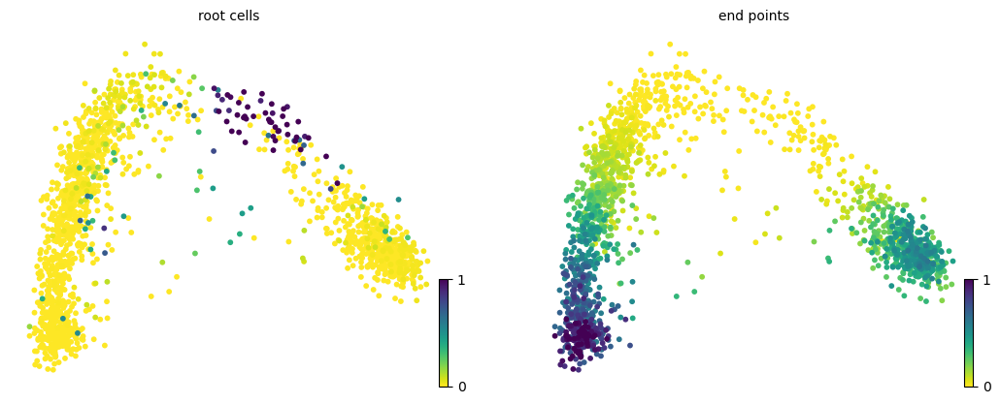

In [138]:
scv.pl.scatter(forebrain_stochastic_st, color=["root_cells", "end_points"], 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_stochastic_root_end_scvelo.png")

#### 3.1.6. Top-spearmans_score genes

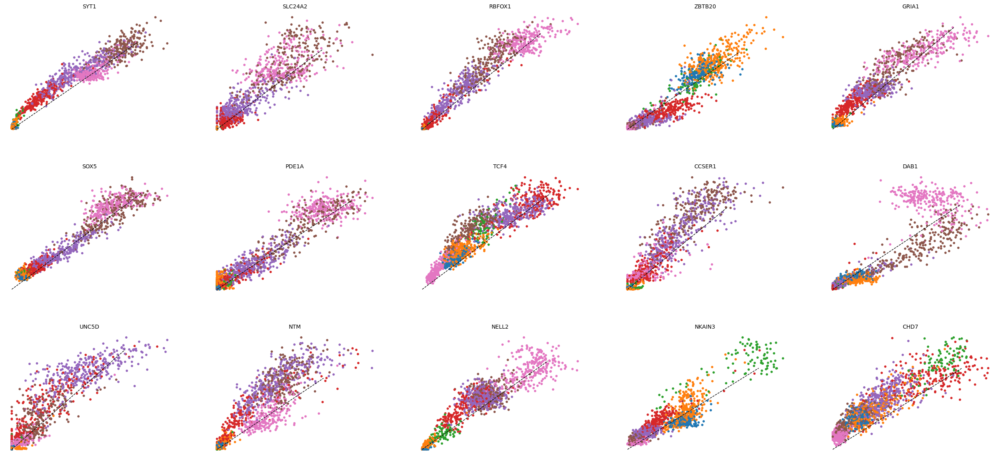

In [139]:
top_genes = forebrain_stochastic_st.var['spearmans_score'].sort_values(ascending=False).index
scv.pl.scatter(forebrain_stochastic_st, basis=top_genes[:15], ncols=5, frameon=False, color="Clusters")


#### 3.1.7. Cluster-specific top-spearmans_score genes

In [140]:
df = scv.get_df(forebrain_stochastic_st, 'rank_velocity_genes/names')
df.head(5)

,0,1,2,3,4,5,6
0,MBNL2,TCF7L2,PSD3,STMN2,CNTNAP2,ATP1A3,LRRTM4
1,STK3,NFATC2,ZFHX4,ST18,KCND2,HIVEP3,RGS6
2,NEDD9,BMPR1B,BAZ2B,GABRB3,NTM,TCF4,LRP1B
3,VCL,COL4A6,DACH1,BCL11B,DPY19L1,MLLT3,SSBP3
4,LATS2,KIAA1217,CCDC109B,PLXNA4,KIAA1199,PCSK2,ANK3


### 3.2. Dynamical model (using scVelo's standard analysis pipeline)

In [157]:
forebrain_dynamical_st = scv.datasets.forebrain()

#### 3.2.1. Analysis

In [158]:
scv.pp.filter_and_normalize(forebrain_dynamical_st, min_shared_counts=20, n_top_genes=2000)

Filtered out 26764 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


In [159]:
scv.pp.moments(forebrain_dynamical_st, n_pcs=30, n_neighbors=30)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [160]:
scv.tl.recover_dynamics(forebrain_dynamical_st, n_jobs=8)

recovering dynamics (using 4/4 cores)


  0%|          | 0/968 [00:00<?, ?gene/s]

    finished (0:05:56) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [161]:
scv.tl.velocity(forebrain_dynamical_st, mode='dynamical')
scv.tl.velocity_graph(forebrain_dynamical_st, n_jobs=8)

computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 4/4 cores)


  0%|          | 0/1720 [00:00<?, ?cells/s]

    finished (0:00:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [162]:
forebrain_dynamical_st.write('data/forebrain_dynamical_standard_analysis.h5ad', compression='gzip')

In [167]:
forebrain_dynamical_st = scv.read('data/forebrain_dynamical_standard_analysis.h5ad')

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_stream_scvelo.png


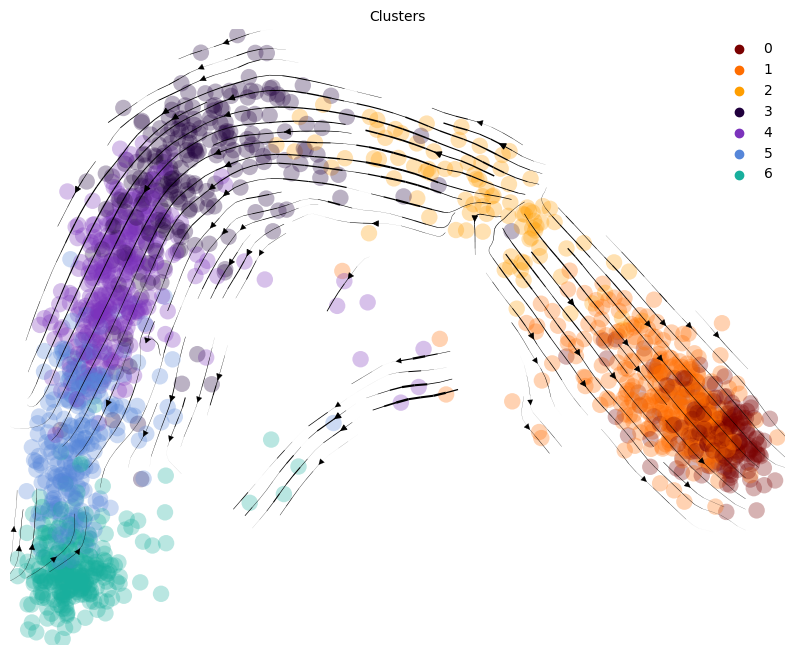

In [164]:
scv.pl.velocity_embedding_stream(forebrain_dynamical_st, basis='pca', palette=forebrain_color_palette, 
                                 color="Clusters", legend_loc="best", figsize=(10,8),
                                 save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_stream_scvelo.png")


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_arrows_scvelo.png


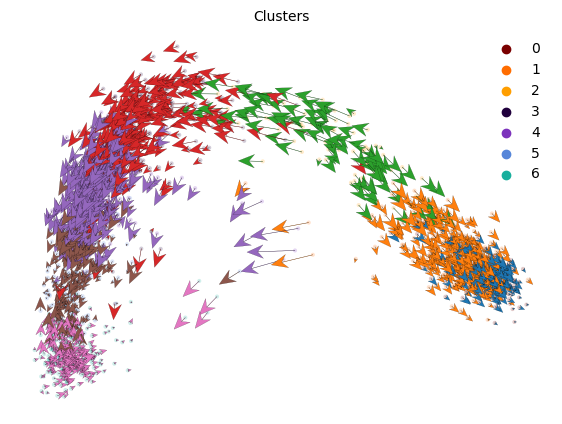

In [166]:
scv.pl.velocity_embedding(forebrain_dynamical_st, basis='pca', arrow_length=5, arrow_size=5, palette=forebrain_color_palette, figsize=(7,5), 
                          color="Clusters", legend_loc="best", save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_arrows_scvelo.png")


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


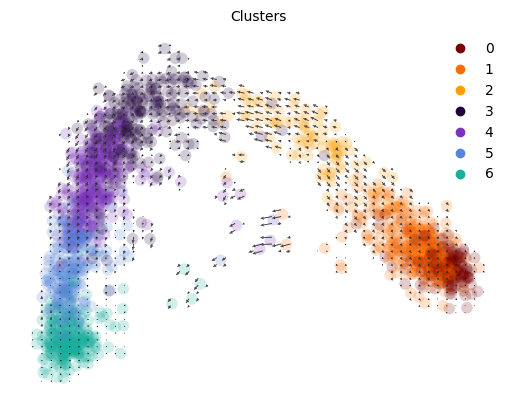

In [168]:
scv.pl.velocity_embedding_grid(forebrain_dynamical_st, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best")


#### 3.2.2. Comparing it to the previous model

In [ ]:
scv.pl.velocity_embedding_stream(forebrain_dynamical, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best")


In [ ]:
scv.pl.velocity_embedding_stream(forebrain_dynamical_st, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best")


#### 3.2.3. Velocity confidence

In [152]:
scv.tl.velocity_confidence(forebrain_dynamical_st)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


In [153]:
np.mean(forebrain_dynamical_st.obs["velocity_confidence"])

0.8188807049636231

In [154]:
np.median(forebrain_dynamical_st.obs["velocity_confidence"])

0.8309527933597565

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_confidence_scvelo.png


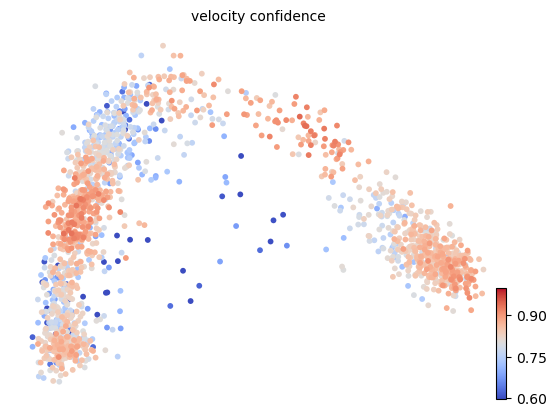

In [155]:
scv.pl.scatter(forebrain_dynamical_st, c="velocity_confidence", cmap="coolwarm", vmin=0.6, vmax=1, 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_confidence_scvelo.png")

#### 3.2.4. Latent time

computing terminal states
    identified 2 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_pseudotime_scvelo.png


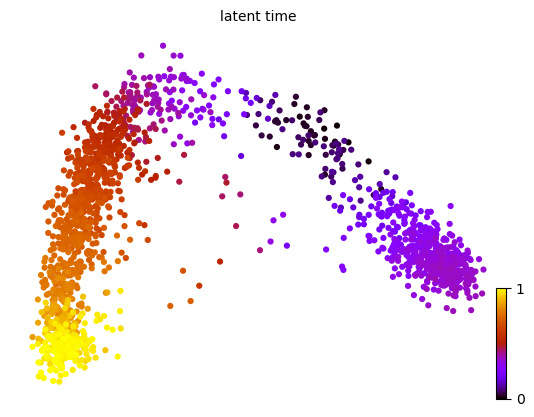

In [169]:
scv.tl.latent_time(forebrain_dynamical_st)
scv.pl.scatter(forebrain_dynamical_st, color='latent_time', color_map='gnuplot', size=80,
              save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_pseudotime_scvelo.png")

saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/fore_dynamical_pseudotime_heatmap_scvelo.png


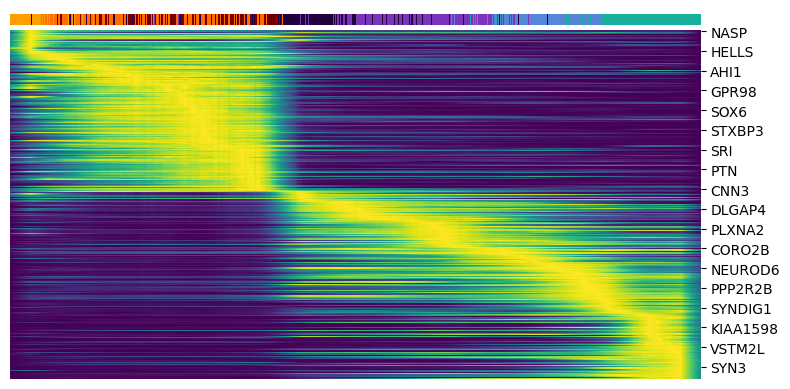

In [171]:
top_genes = forebrain_dynamical_st.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(forebrain_dynamical_st, var_names=top_genes, sortby='latent_time', col_color='Clusters',  
               n_convolve=100, save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_pseudotime_heatmap_scvelo.png")


#### 3.2.5. Root cells and endpoints

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_root_end_scvelo.png


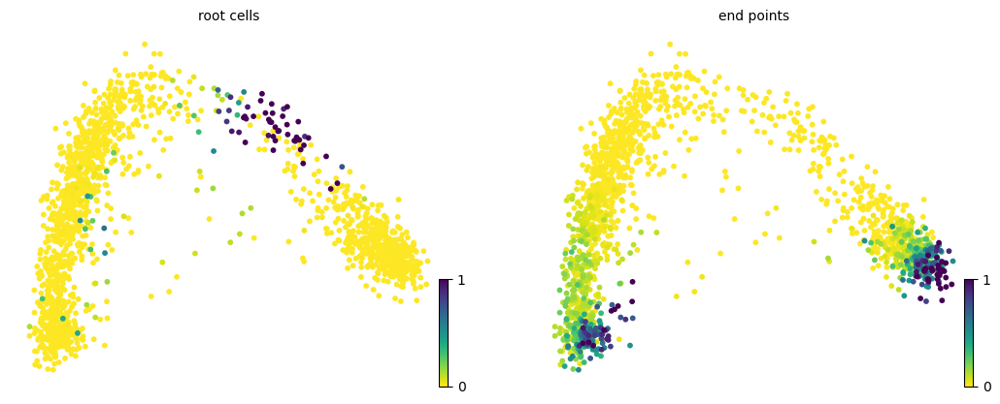

In [172]:
scv.pl.scatter(forebrain_dynamical_st, color=["root_cells", "end_points"], 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_dynamical_root_end_scvelo.png")

#### 3.2.6. Top-likelihood genes

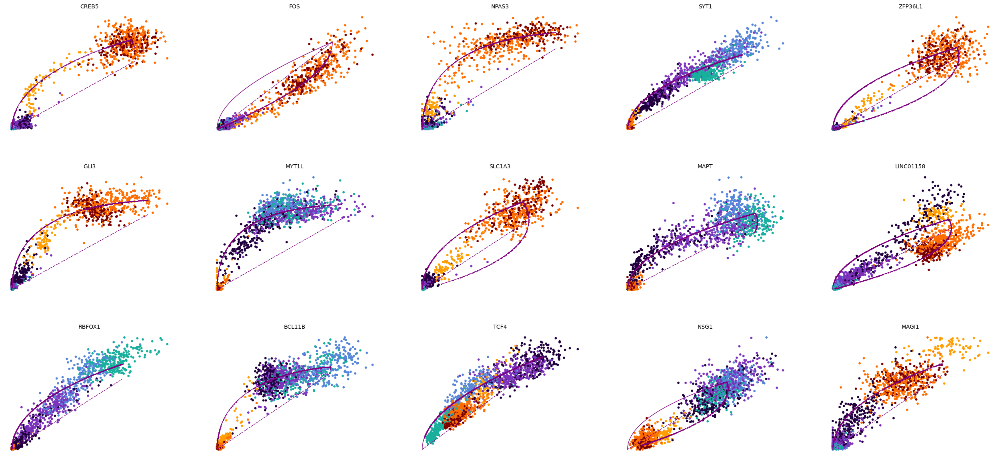

In [173]:
top_genes = forebrain_dynamical_st.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(forebrain_dynamical_st, basis=top_genes[:15], ncols=5, frameon=False, color="Clusters")


#### 3.2.7. Cluster-specific top-likelihood genes

In [174]:
scv.tl.rank_dynamical_genes(forebrain_dynamical_st, groupby='Clusters')
df = scv.get_df(forebrain_dynamical_st, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:03) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,0,1,2,3,4,5,6
0,CREB5,CREB5,CREB5,SYT1,SYT1,ELAVL4,MAPT
1,NPAS3,LINC01158,GLI3,MAPT,MYT1L,TCF4,SYT1
2,FOS,NPAS3,CPE,MYT1L,NFIA,STMN2,MYT1L
3,LINC01158,GLI3,NFIB,NELL2,BCL11B,RBFOX1,NSG1
4,ZFP36L1,ZFP36L1,HMGN3,BCL11B,TMSB10,NFIA,STMN2


### 3.3. Deterministic model (using scVelo's standard analysis pipeline)

In [175]:
forebrain_deterministic_st = scv.datasets.forebrain()
forebrain_deterministic_st

AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'Clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

#### 3.3.1. Analysis

In [176]:
scv.pp.filter_and_normalize(forebrain_deterministic_st, min_shared_counts=20, n_top_genes=2000)

Filtered out 26764 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


In [177]:
scv.pp.moments(forebrain_deterministic_st, n_pcs=30, n_neighbors=30)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [178]:
scv.tl.velocity(forebrain_deterministic_st, mode="deterministic")

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [179]:
scv.tl.velocity_graph(forebrain_deterministic_st)

computing velocity graph (using 1/4 cores)


  0%|          | 0/1720 [00:00<?, ?cells/s]

    finished (0:00:11) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_stream_scvelo.png


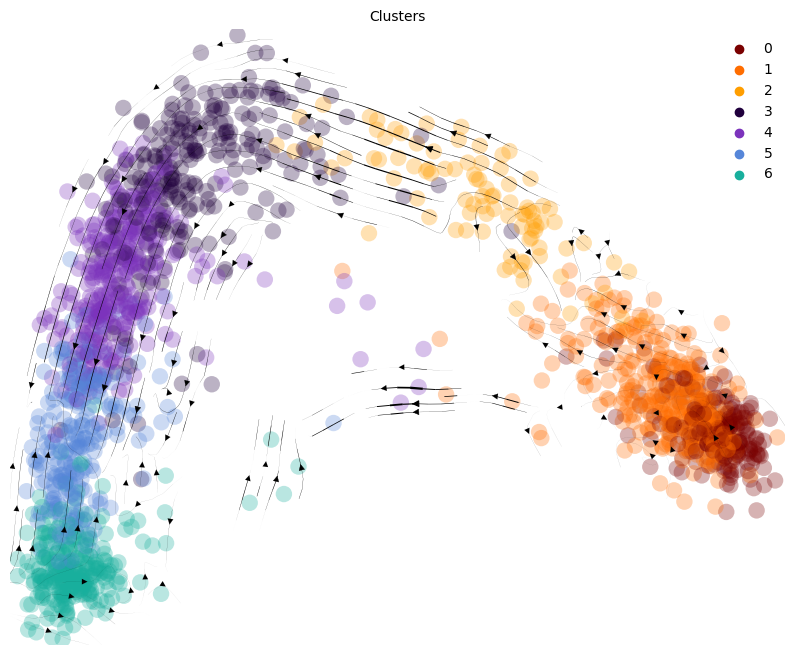

In [181]:
scv.pl.velocity_embedding_stream(forebrain_deterministic_st, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best", figsize=(10,8),
                                 save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_stream_scvelo.png")


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_arrows_scvelo.png


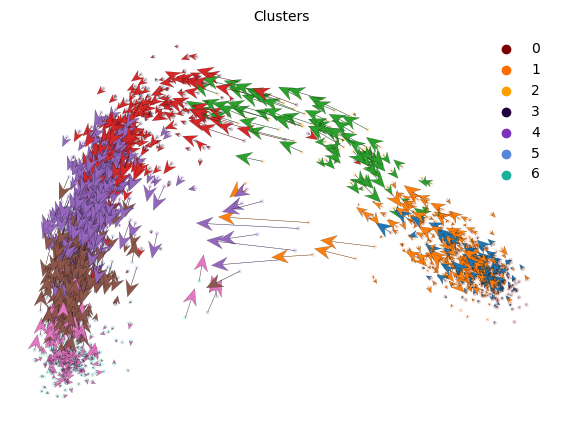

In [183]:
scv.pl.velocity_embedding(forebrain_deterministic_st, basis='pca', arrow_length=5, arrow_size=5, palette=forebrain_color_palette, figsize=(7,5), 
                          color="Clusters", legend_loc="best", save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_arrows_scvelo.png")


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


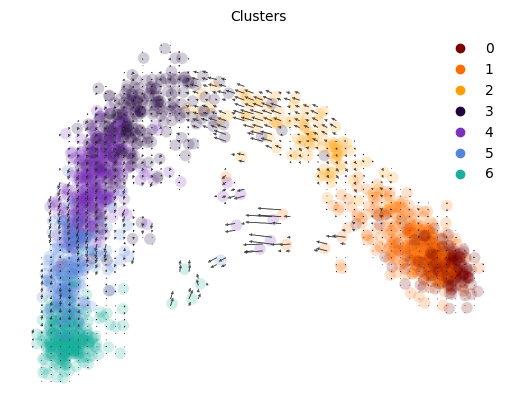

In [185]:
scv.pl.velocity_embedding_grid(forebrain_deterministic_st, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best")


#### 3.3.2. Comparing it to the previous model

In [ ]:
scv.pl.velocity_embedding_stream(forebrain_deterministic, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best")


In [ ]:
scv.pl.velocity_embedding_stream(forebrain_deterministic_st, basis='pca', palette=forebrain_color_palette, color="Clusters", legend_loc="best")


#### 3.3.3. Velocity confidence

In [186]:
scv.tl.velocity_confidence(forebrain_deterministic_st)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


In [187]:
np.mean(forebrain_deterministic_st.obs["velocity_confidence"])

0.7051795054660287

In [188]:
np.median(forebrain_deterministic_st.obs["velocity_confidence"])

0.7102021276950836

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_confidence_scvelo.png


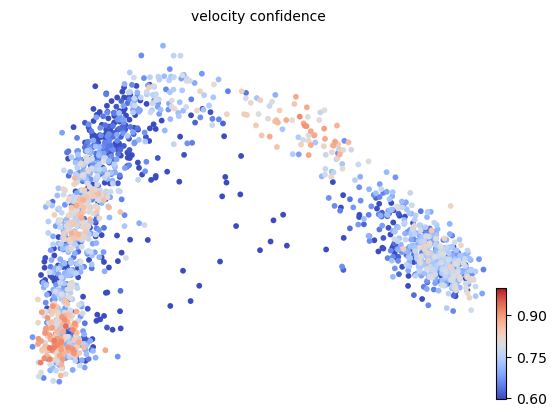

In [189]:
scv.pl.scatter(forebrain_deterministic_st, c="velocity_confidence", cmap="coolwarm", vmin=0.6, vmax=1, 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_confidence_scvelo.png")

#### 3.3.4. Velocity pseudotime (comparable to latent time)

In [190]:
scv.tl.velocity_pseudotime(forebrain_deterministic_st)

computing terminal states
    identified 2 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_pseudotime_scvelo.png


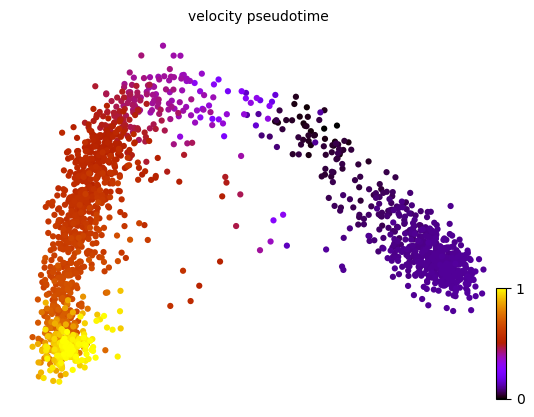

In [191]:
scv.pl.scatter(forebrain_deterministic_st, basis="pca", color='velocity_pseudotime', color_map='gnuplot', size=80,
              save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_pseudotime_scvelo.png")

In [192]:
scv.tl.rank_velocity_genes(forebrain_deterministic_st, groupby='Clusters')

ranking velocity genes


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\tools\utils.py:501: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:03) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/fore_deterministic_pseudotime_heatmap_scvelo.png


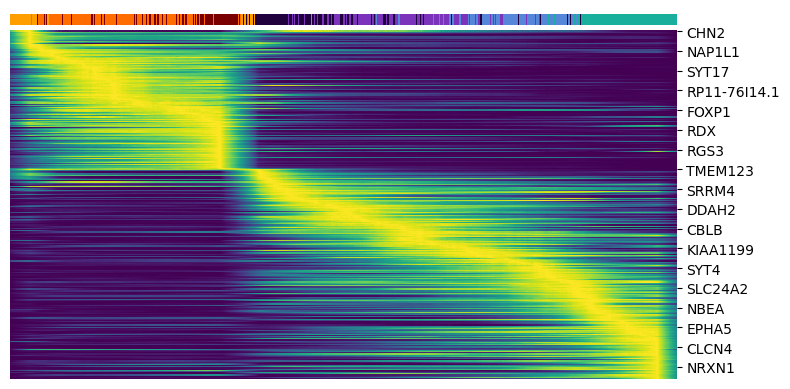

In [194]:
top_genes = forebrain_deterministic_st.var['spearmans_score'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(forebrain_deterministic_st, var_names=top_genes, sortby='velocity_pseudotime', col_color='Clusters', 
               n_convolve=100, save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_pseudotime_heatmap_scvelo.png")


#### 3.3.5. Root cells and endpoints

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_root_end_scvelo.png


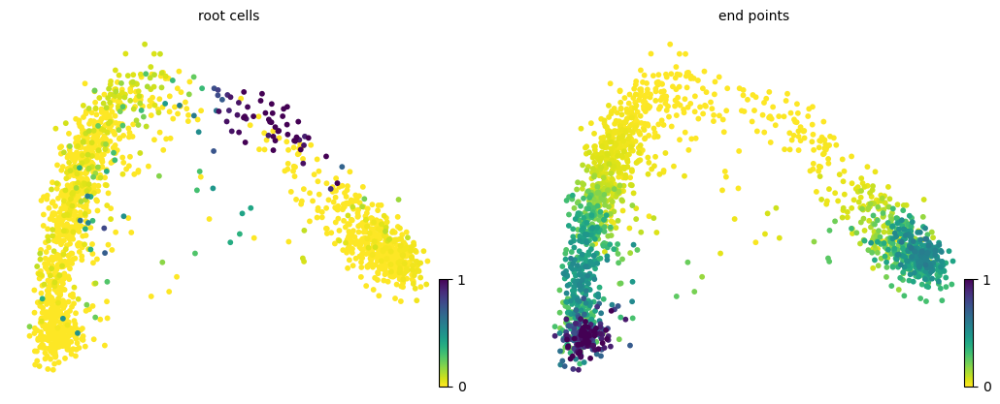

In [195]:
scv.pl.scatter(forebrain_deterministic_st, color=["root_cells", "end_points"], 
               save="./Results/Plots/velocyto_and_scvelo_plots/forebrain_deterministic_root_end_scvelo.png")

#### 3.3.6. Top-spearmans_score genes

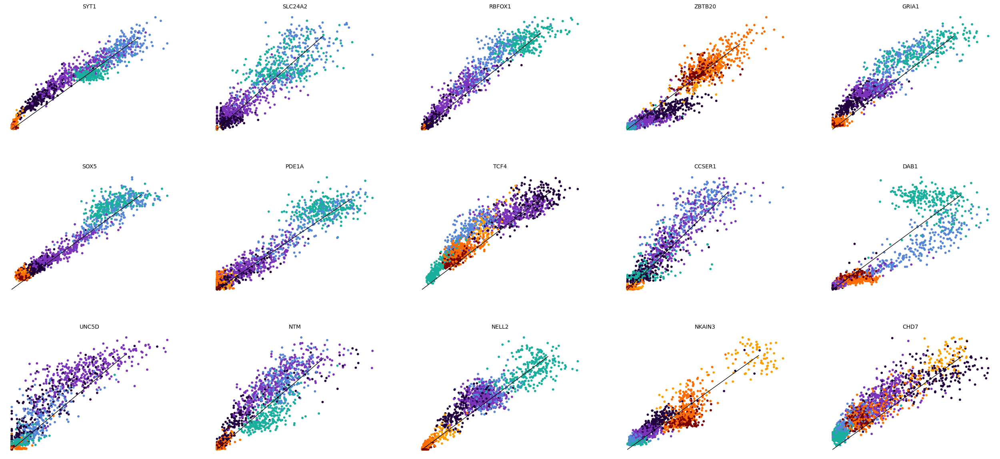

In [196]:
top_genes = forebrain_deterministic_st.var['spearmans_score'].sort_values(ascending=False).index
scv.pl.scatter(forebrain_deterministic_st, basis=top_genes[:15], ncols=5, frameon=False, color="Clusters")


#### 3.3.7. Cluster-specific top-spearmans_score genes

In [197]:
df = scv.get_df(forebrain_deterministic_st, 'rank_velocity_genes/names')
df.head(5)

,0,1,2,3,4,5,6
0,MBNL2,NFATC2,ZFHX4,STMN2,CNTNAP2,ATP1A3,ANK3
1,STK3,SYNE2,MAP2,BCL11B,SCD5,TCF4,IDI1
2,RPL34,SIPA1L1,BAZ2B,GABRB3,KCND2,MLLT3,MSMO1
3,SYNE2,EVA1C,CA12,CELF4,NRXN1,MYT1L,NFIB
4,VCL,GAP43,ST18,ST18,NNAT,RP11-402J6.1,CLMP


## 4. Análisis con Velocyto

### 4.1. Modelo de Velocyto

In [2]:
vlm = vcy.VelocytoLoom("ForebrainGlut/hgForebrainGlut.loom")

#### 4.1.1. Preliminary filtering

In [3]:
# In the following cells, we're simply going to establish which are the clusters (using "set_clusters") and indicate the colors that correspond
# to each and everyone of these clusters (also using "set_clusters" but we previously have to create a dictionary with the colors)

labels = vlm.ca["Clusters"]
manual_annotation = {str(i):[i] for i in labels}
annotation_dict = {v:k for k, values in manual_annotation.items() for v in values }
clusters = np.array([annotation_dict[i] for i in labels])
forebrain_color_palette = {"0": '#7A0000', "1": '#FF6D00', "2": '#FF9E00', "3": "#20003D", 
                           "4": "#7C33BC", "5": "#5686D9", "6": "#18AF9D"} 

In [4]:
# Utility function to set cluster labels, names and colormap

vlm.set_clusters(clusters, cluster_colors_dict=forebrain_color_palette)

### Return type: It creates the attributes cluster_labels, colorandum, cluster_ix, cluster_uid.

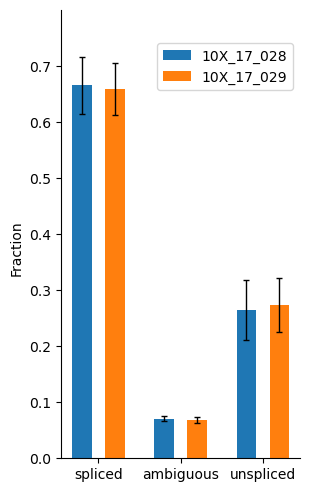

In [5]:
vlm.plot_fractions()

In [6]:
# just to find the initial cell size
# Here, we normalize the spliced and unspliced matrices, but we don't perform a log transformation

vlm.normalize("S", size=True, log=False)
vlm.normalize("U", size=True,  log=False)

# _normalize_S --> Internal function for the spliced molecule filtering. The `normalize` method should be used as a standard interface
# _normalize_U --> Internal function for the unspliced molecule filtering. The `normalize` method should be used as a standard interface

### Return type (normalize): creates the attributes U_norm, U_sz and S_norm, “S_sz”  
### or Ux_norm, Ux_sz and Sx_norm, “Sx_sz” (this last one is not our case)

In [7]:
# First, we score the genes and cells whose expression is above a threshold of total number of molecules in any of the clusters (on the basis of the spliced counts)
# Then, we filter the genes according to this score

vlm.score_detection_levels(min_expr_counts=30, min_cells_express=20,
                           min_expr_counts_U=0, min_cells_express_U=0)
vlm.filter_genes(by_detection_levels=True)

### Return type (score_detection_level): The attribute self.detection_level_selected is created
### Return type (filter_genes): It updates the self.S, self.U, self.ra attributes

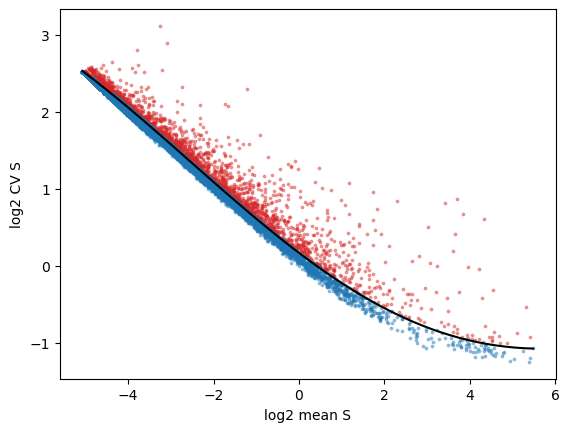

In [8]:
# Perform feature (gene) selection, in this case, we select 2000 genes
# score_cv_vs_mean = Rank genes on the basis of a CV vs mean fit, it uses a nonparametric fit (Support Vector Regression)
# CV = coefficient of variation

vlm.score_cv_vs_mean(2000, plot=True, max_expr_avg=50, winsorize=True, winsor_perc=(1,99.8), svr_gamma=0.01, min_expr_cells=50)
vlm.filter_genes(by_cv_vs_mean=True)  # We filter genes again (by_cv_vs_mean (bool, default=False) –> filter genes by the score_cluster_expression result)

### Return type: It creates the attributes
    ### cv_mean_score (np.ndarray) –> How much the observed CV is higher than the one predicted by a noise model fit to the data
    ### cv_mean_selected (np.ndarray bool) –> on the basis of the N parameter
    ### Note: genes excluded from the fit will have in the output the same score as the lowest scoring gene in the dataset.
    ### To perform the filtering use the method filter_genes

In [9]:
# Once again,we score the genes and cells whose expression is above a threshold, but this time on the basis of the unspliced counts

vlm.score_detection_levels(min_expr_counts=0, min_cells_express=0,
                           min_expr_counts_U=25, min_cells_express_U=20)

### Return type: The attribute self.detection_level_selected is created

In [10]:
# Prepare filtering genes on the basis of cluster-wise expression threshold

vlm.score_cluster_expression(min_avg_U=0.007, min_avg_S=0.06)

### Return type: It creates the attribute clu_avg_selected (np.ndarray bool), which has the gene cluster that is selected

In [11]:
# Now, the filtering is on the basis of the detection levels but, also, on the basis of cluster expression

vlm.filter_genes(by_detection_levels=True, by_cluster_expression=True)

### Return type: It updates the self.S, self.U, self.ra attributes

In [12]:
# Normalize the cells using the (initial) total molecules as size estimate

vlm.normalize_by_total(min_perc_U=0.5)

### Return type: it creates the attribute: small_U_pop (np.ndarray) –> Cells with extremely low unspliced count

In [13]:
# Adjust the spliced count on the base of the relation S_sz_tot and U_sz_tot

vlm.adjust_totS_totU(normalize_total=True, fit_with_low_U=False, svr_C=1, svr_gamma=1e-04)

### Return type: it modifies the attribute U_sz (np.ndarray)

#### 4.1.2. Preparation for gamma fit

6

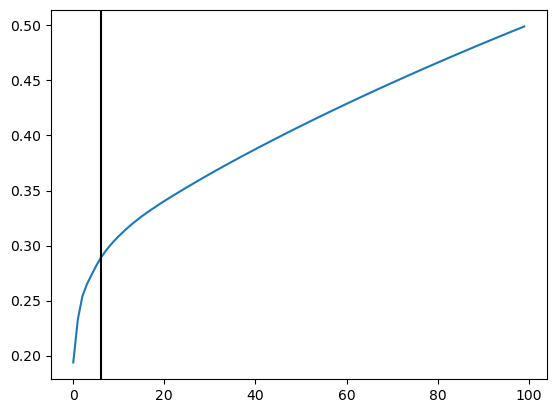

In [14]:
# Here, we are performing the principal components analysis (PCA) with all the components and 
# then, plotting the graph to show us why we will be using 6 principal components (PC) moving forward

vlm.perform_PCA()
plt.plot(np.cumsum(vlm.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(vlm.pca.explained_variance_ratio_))>0.0055))[0][0]
plt.axvline(n_comps, c="k")
vlm.pcs[:,1] *= -1 # flip for consistency with previous version

n_comps

In [15]:
k = 550
vlm.knn_imputation(n_pca_dims=n_comps,k=k, balanced=True,
                   b_sight=np.minimum(k*8, vlm.S.shape[1]-1),
                   b_maxl=np.minimum(k*4, vlm.S.shape[1]-1))

#### 4.1.3 Gamma fit and extrapolation

In [16]:
vlm.normalize_median()

In [17]:
# To fit gamma to every gene that survived the filtering step

vlm.fit_gammas(maxmin_perc=[2,95], limit_gamma=True)

### Return type: it just creates the attributes:
    ### gammas (np.ndarray) –> the vector of the gammas fit to each gene
    ### q (np.ndarray) –> the vector of offsets of the fit
    ### R2 (np.ndarray (optional)) –> The vector of squared coefficient of determination

In [18]:
vlm.normalize(which="imputed", size=False, log=True)

In [19]:
vlm.Pcs = np.array(vlm.pcs[:,:2], order="C")

In [20]:
# Calculate velocity and extrapolate the future state of the cells

vlm.predict_U()                                           # Predict U (gamma * S) given the gamma model fit
vlm.calculate_velocity()                                  # Calculate velocity
vlm.calculate_shift()                                     # Find the change (deltaS) in gene expression for every cell
                                                            # assumption(default="constant_velocity") –> constant_velocity (described in the paper as Model I) 
vlm.extrapolate_cell_at_t(delta_t=1)                     # Extrapolate the gene expression profile for each cell after delta_t

### Return type (predict_U): It creates the attribute Upred (np.ndarray) –> unspliced estimated as gamma * S
### Return type (calculate_velocity): It creates the attribute velocity (np.ndarray) –> U_measured - U_predicted
### Return type (calculate_shift): It creates the attribute delta_S (np.ndarray) –> The variation in gene expression
### Return type (extrapolate_cell_at_t): It creates the attributes:
    ### x_sz_t (np.ndarray) –> the extrapolated expression profile
    ### used_delta_t (float) –> stores delta_t for future usage

#### 4.1.4. Projection of velocity onto embeddings


The extrapolated cell state is a vector in expression space (available as the attribute vlm.Sx_sz_t). One of the most convenient way to visualize the extrapolated state is to project it on a low dimensional embedding that appropriately summarizes the variability of the data that is of interest, in this case, a t-SNE map. 

In [21]:
vlm.estimate_transition_prob(hidim="Sx_sz", embed="Pcs", transform="log", psc=1,
                             n_neighbors=150, knn_random=True, sampled_fraction=1)

In [22]:
vlm.calculate_embedding_shift(sigma_corr = 0.05, expression_scaling=False)

In [23]:
vlm.calculate_grid_arrows(smooth=0.9, steps=(25, 25), n_neighbors=200)

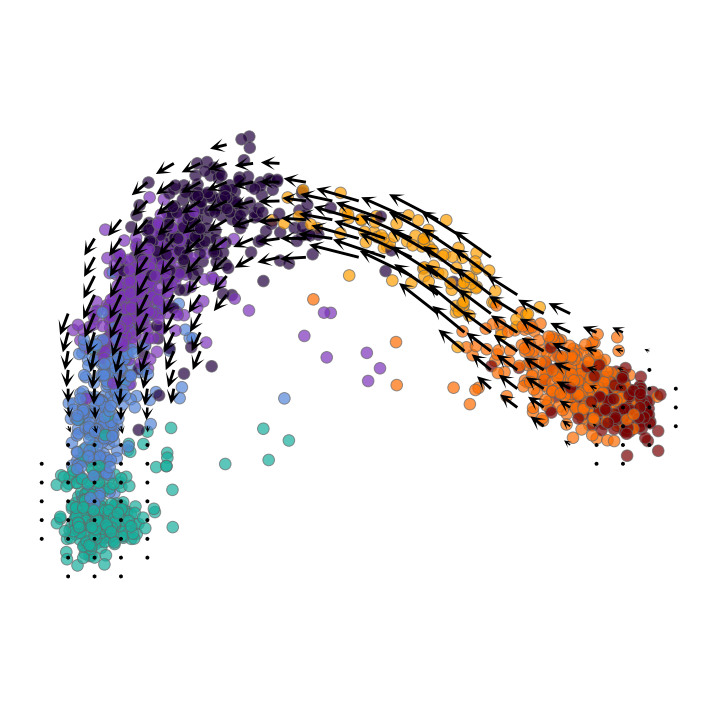

In [24]:
plt.figure(None,(9,9))
vlm.plot_grid_arrows(scatter_kwargs_dict={"alpha":0.7, "lw":0.7, "edgecolor":"0.4", "s":70, "rasterized":True},
                     min_mass=2.9, angles='xy', scale_units='xy',
                     headaxislength=2.75, headlength=5, headwidth=4.8, quiver_scale=0.35, scale_type="absolute")
plt.gca().invert_yaxis()

plt.axis("off")
plt.axis("equal")
plt.savefig("./Results/Plots/velocyto_and_scvelo_plots/forebrain_velocyto_grid.png")

## What each cluster represents:
    # Blues --> Radial glia
    # Greens --> Neuroblast
    # Ochers --> Immature neuron
    # Reds--> Neuron   

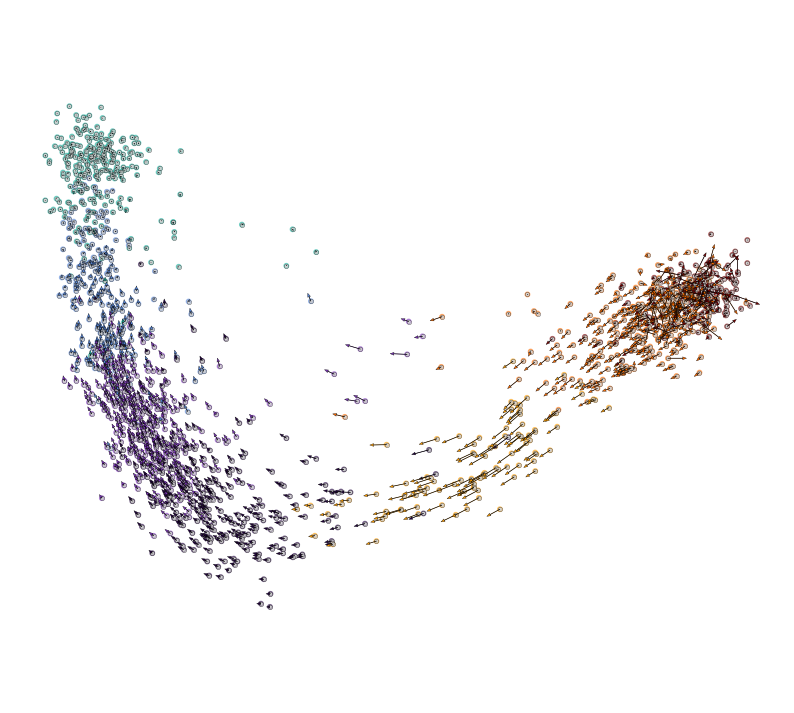

In [38]:
# Fancier plot (from DentateGyrus_velocyto_tutorial.ipynb)

plt.figure(None,(10,9))
quiver_scale = 40

plt.scatter(vlm.embedding[:, 0], vlm.embedding[:, 1],
            c="0.8", alpha=0.6, s=10, edgecolor=vlm.colorandum)       

ix_choice = np.random.choice(vlm.embedding.shape[0], size=int(vlm.embedding.shape[0]/1.), replace=False)
plt.scatter(vlm.embedding[ix_choice, 0], vlm.embedding[ix_choice, 1],
            c="0.8", alpha=0.6, s=10, edgecolor=(0,0,0,1), lw=0.3, rasterized=True)

quiver_kwargs=dict(headaxislength=10, headlength=11, headwidth=8,linewidths=0.25, width=0.00045,edgecolors="k", 
                   color=vlm.colorandum[ix_choice], alpha=1)
plt.quiver(vlm.embedding[ix_choice, 0], vlm.embedding[ix_choice, 1],
           vlm.delta_embedding[ix_choice, 0], vlm.delta_embedding[ix_choice, 1],
           scale=quiver_scale, **quiver_kwargs, )


plt.axis("off")
plt.axis("equal")
plt.savefig("./Results/Plots/velocyto_and_scvelo_plots/forebrain_velocyto_arrows.png")

#### 4.1.5. Root cells and endpoints

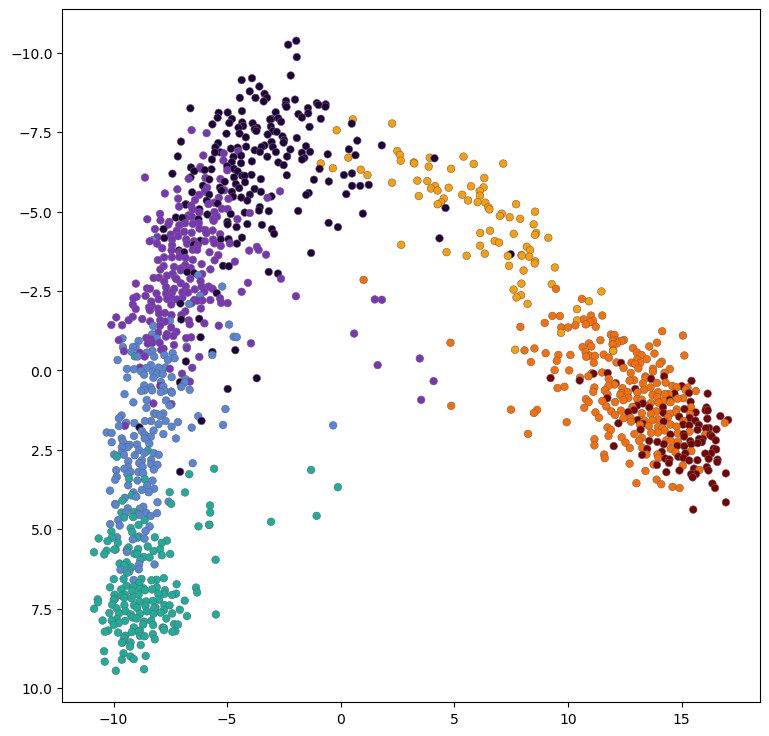

In [108]:
# Sample uniformly the points to avoid density driven effects - Should reimplement as a method
steps = 100, 100
grs = []
for dim_i in range(vlm.embedding.shape[1]): # In the first loop, it does it for the "x" coordinate, and in the second loop, for the "y" coordinate
    m, M = np.min(vlm.embedding[:, dim_i]), np.max(vlm.embedding[:, dim_i]) # Obtain min and max value of the coordinates
    m = m - 0.025 * np.abs(M - m)  # Modify a bit this value. np.abs is used to calculate the absolute value (I don't understand why)
    M = M + 0.025 * np.abs(M - m)  # Modify a bit this value. np.abs is used to calculate the absolute value (I don't understand why)
    gr = np.linspace(m, M, steps[dim_i])  # np.linspace --> Return evenly spaced numbers over a specified interval. 
                                          # (in this case, steps indicates how many values we can have (45), so the spaces are calculated so we only have 45 numbers)
    grs.append(gr) # gr format values for x and y coordinates
    
meshes_tuple = np.meshgrid(*grs) # same values as grs
gridpoints_coordinates = np.vstack([i.flat for i in meshes_tuple]).T # same values as grs, but we've merged the two arrays 
                                                                     # so we have only one with "x" and "y" coordinates

from sklearn.neighbors import NearestNeighbors
nn = NearestNeighbors()
nn.fit(vlm.embedding) # Fit the nearest neighbors estimator from the training dataset, which, in this case, is vlm.embedding
dist, ixs = nn.kneighbors(gridpoints_coordinates, 1)  # Finds the K-neighbors of a point and returns indices of and distances to the neighbors of each point
                                                      # The 1 corresponds to the number of neighbors required for each sample

diag_step_dist = np.sqrt((meshes_tuple[0][0,0] - meshes_tuple[0][0,1])**2 + (meshes_tuple[1][0,0] - meshes_tuple[1][1,0])**2) 
        # substracts the values of the first value of the first two x coordinates, squares it (**2 = squared) 
        # and adds this value to the same step but for the y coordinates 
min_dist = diag_step_dist / 2 # divides the previous value by two
ixs = ixs[dist < min_dist] # cells where dist is less than the min_dist
gridpoints_coordinates = gridpoints_coordinates[dist.flat[:]<min_dist,:]
dist = dist[dist < min_dist]

ixs = np.unique(ixs) # unique cells where dist is less than the min_dist

plt.figure(None,(9,9))
plt.gca().invert_yaxis()
vcy.scatter_viz(vlm.embedding[ixs, 0], vlm.embedding[ixs, 1],
                c=vlm.colorandum[ixs], alpha=1, s=30, lw=0.4, edgecolor="0.4")

In [74]:
# Prepare a transition probability for Markov process

vlm.prepare_markov(sigma_D=diag_step_dist, sigma_W=diag_step_dist/2., direction='forward', cells_ixs=ixs)

# sigma_D (float) – the standard deviation used on the locality-limiting component
# sigma_W (float) – the standard deviation used on the noise component
# direction (str, default="backwards") – whether to diffuse forward of backwards (difference in obtaining the endpoints (forward) vs the root cells (backwards))
# cells_ixs (np.ndarray, default=None) – Cells to use, if None all the cells will be considered.

### Returns --> tr (np.ndarray) – the transition probability matrix

In [75]:
# Run a Markov process

vlm.run_markov(starting_p=np.ones(len(ixs)), n_steps=2500) 

# starting_p (np.ndarray, default=None) – specifies the starting density if None is passed an array of 1/self.tr.shape[0] will be created
# n_steps (np.ndarray, default=2500) – Numbers of steps to be performed
# mode (str, default="time_evolution") – this argument is passed to the Diffusion.diffuse call

### Returns --> diffused (np.ndarray) – The probability to be found at any of the states

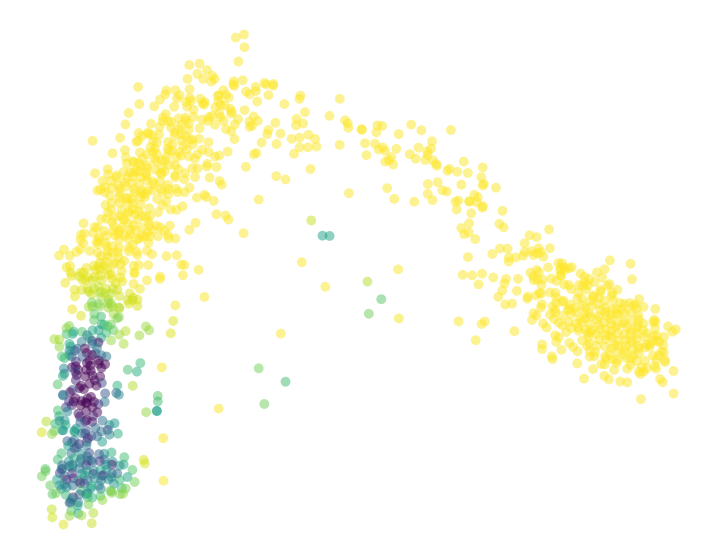

In [77]:
# Endpoints

diffused_n = vlm.diffused - np.percentile(vlm.diffused, 3)
diffused_n /= np.percentile(diffused_n, 97)
diffused_n = np.clip(diffused_n, 0, 1)

plt.figure(None,(9,7))
vcy.scatter_viz(vlm.embedding[ixs, 0], vlm.embedding[ixs, 1],
                c=diffused_n, alpha=0.5, s=50, lw=0., cmap="viridis_r", rasterized=True)
plt.axis("off")
plt.gca().invert_yaxis()
plt.savefig("./Results/Plots/velocyto_and_scvelo_plots/forebrain_velocyto_endpoints.png")

We have to run the code each time we want to generate the root cells because running the code for the endpoints overwrites it

In [ ]:
vlm.prepare_markov(sigma_D=diag_step_dist, sigma_W=diag_step_dist/2., direction='backwards', cells_ixs=ixs)

In [ ]:
vlm.run_markov(starting_p=np.ones(len(ixs)), n_steps=2500)

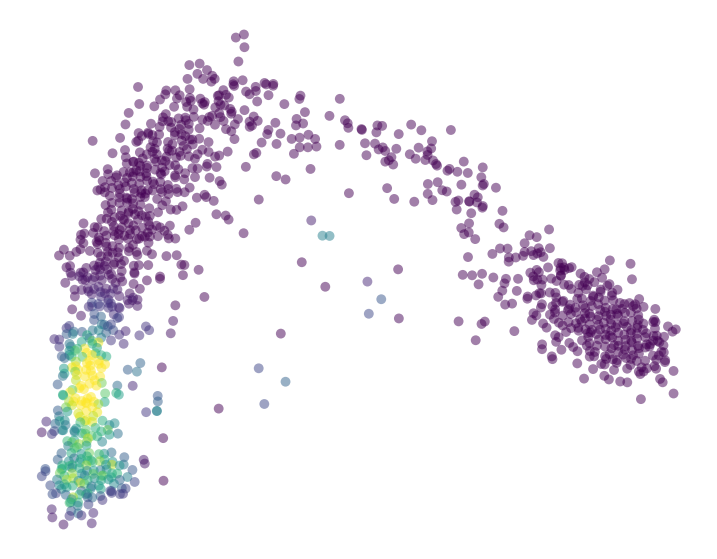

In [79]:
# Root cells

diffused_n = vlm.diffused - np.percentile(vlm.diffused, 3)
diffused_n /= np.percentile(diffused_n, 97)
diffused_n = np.clip(diffused_n, 0, 1)

plt.figure(None,(9,7))
vcy.scatter_viz(vlm.embedding[ixs, 0], vlm.embedding[ixs, 1],
                c=diffused_n, alpha=0.5, s=50, lw=0., cmap="viridis_r", rasterized=True)
plt.axis("off")
plt.gca().invert_yaxis()
plt.savefig("./Results/Plots/velocyto_and_scvelo_plots/forebrain_velocyto_rootcells.png")